## Basic visualisations.
Distribution of stars in open restaurants.

In [ ]:

import numpy as np
import pandas as pd

import gc
import os

import matplotlib.pyplot as plt
import seaborn as sns 
import matplotlib.gridspec as gridspec 
import matplotlib.gridspec as gridspec 

import imageio
import folium
import folium.plugins as plugins

%matplotlib inline

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
os.chdir('/content/drive/MyDrive/yelp/notebooks')

In [ ]:
data_bus = pd.read_parquet(r'../data/restaurants/restaurants_open_definitive.parquet')

In [ ]:
data_bus.stars.describe().T.to_frame()

,stars
count,34950.000000
mean,3.523405
std,0.862767
min,1.000000
25%,3.000000
50%,3.500000
75%,4.000000
max,5.000000


/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


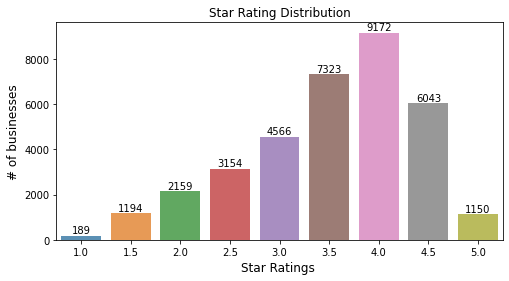

In [ ]:
#Get the distribution of the ratings
x=data_bus['stars'].value_counts()
x=x.sort_index()
#plot
plt.figure(figsize=(8,4))
ax= sns.barplot(x.index, x.values, alpha=0.8)
plt.title("Star Rating Distribution")
plt.ylabel('# of businesses', fontsize=12)
plt.xlabel('Star Ratings ', fontsize=12)

#adding the text labels
rects = ax.patches
labels = x.values
for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(rect.get_x() + rect.get_width()/2, height + 5, label, ha='center', va='bottom')

plt.show()

## Categories. 


In [ ]:
categoria_2_mas_presente=data_bus.category_2.value_counts().to_frame().reset_index().rename(columns={'index':'codigo'}).set_index('codigo')
categorias_descrip=data_rew=pd.read_parquet("../data/business/categories_df.parquet")
categorias_descrip=categorias_descrip.reset_index().rename(columns={'index':'categoria'}).set_index('codigo')
restaurants_categories = categorias_descrip.join(categoria_2_mas_presente,how='inner').sort_values(by='category_2',ascending=False)
caterory_2_plot=categorias_descrip.join(categoria_2_mas_presente,how='inner').sort_values(by='category_2',ascending=False).head(20)

In [ ]:
restaurants_categories.head()

,categoria,category_2
codigo,,
1,Food,10805
5,Nightlife,4502
11,Sandwiches,3020
14,Pizza,2489
16,Fast Food,2132


In [ ]:
restaurants_categories.tail(10)

,categoria,category_2
codigo,,
377,Tapas Bars,1
886,Fondue,1
441,Creperies,1
733,Brasseries,1
837,Portuguese,1
829,Dinner Theater,1
637,Kosher,1
783,Basque,1
752,Afghan,1


/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


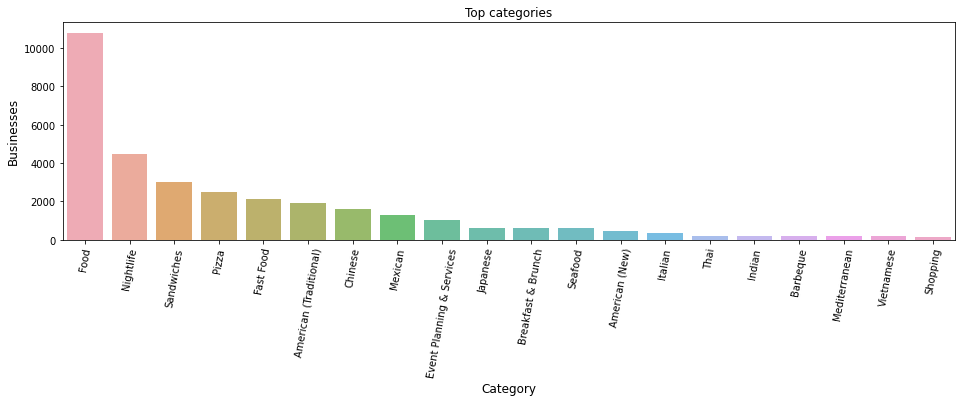

In [ ]:
plt.figure(figsize=(16,4))
ax = sns.barplot(caterory_2_plot.categoria, caterory_2_plot.category_2, alpha=0.8)#,color=color[5])
plt.title("Top categories")
locs, labels = plt.xticks()
plt.setp(labels, rotation=80)
plt.ylabel('Businesses', fontsize=12)
plt.xlabel('Category', fontsize=12)

plt.show()

In [ ]:
df_city_unique=data_bus.drop_duplicates(subset='city',keep=False)

Locations = list(zip(df_city_unique.latitude, df_city_unique.longitude))

f = folium.Figure(width=1000, height=500)
dcmap =  folium.Map(location=[48, -102], zoom_start=4).add_to(f)

for loc in Locations:
   markers = folium.CircleMarker(location=loc,radius=6,fill=True, fill_opacity=1)
   dcmap.add_child(markers)

#Set the zoom to the maximum possible
dcmap.fit_bounds(f.get_bounds())

dcmap

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 0, 'City')

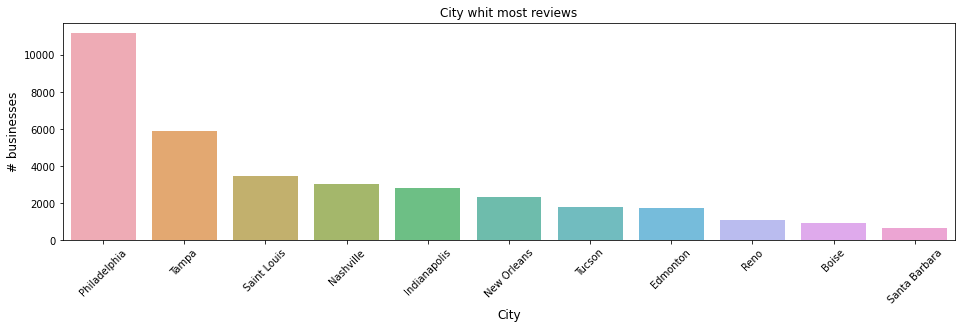

In [ ]:
#Get the distribution of the ratings
x=data_bus['metro_area'].value_counts()
x=x.sort_values(ascending=False)
x=x.iloc[0:20]
plt.figure(figsize=(16,4))
ax = sns.barplot(x.index, x.values, alpha=0.8)
plt.title("City whit most reviews")
locs, labels = plt.xticks()
plt.setp(labels, rotation=45)
plt.ylabel('# businesses', fontsize=12)
plt.xlabel('City', fontsize=12)

In [ ]:
metro_to_plot='Philadelphia'

df_f=data_bus[data_bus.metro_area==metro_to_plot]
Locations = list(zip(df_f.latitude, df_f.longitude))

f = folium.Figure(width=1500, height=750)


dcmap =  folium.Map(location=[40, -75], zoom_start=2.5).add_to(f)

for loc in Locations:
   markers = folium.CircleMarker(location=loc,radius=1,fill=True, fill_opacity=1)
   dcmap.add_child(markers)
dcmap.fit_bounds(f.get_bounds())
dcmap

In [ ]:
metro_to_plot='Tampa'

df_f=data_bus[data_bus.metro_area==metro_to_plot]
Locations = list(zip(df_f.latitude, df_f.longitude))

f = folium.Figure(width=1500, height=750)


dcmap =  folium.Map(location=[48, -102], zoom_start=3).add_to(f)

for loc in Locations:
   markers = folium.CircleMarker(location=loc,radius=1,fill=True, fill_opacity=1)
   dcmap.add_child(markers)
dcmap.fit_bounds(f.get_bounds())
dcmap

Text(0.5, 1.0, 'Ratings per price range')

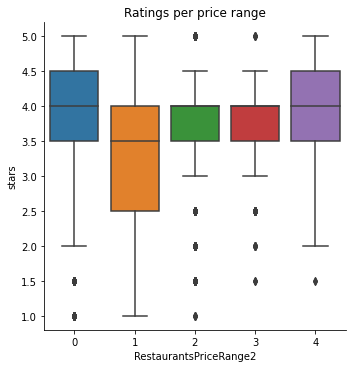

In [ ]:
# Prize - stars boxplot.
sns.catplot(y = 'stars', x = 'RestaurantsPriceRange2', data = data_bus, kind = "box")
plt.title("Ratings per price range")

Text(0.5, 1.0, 'Count of ratings per price ranges')

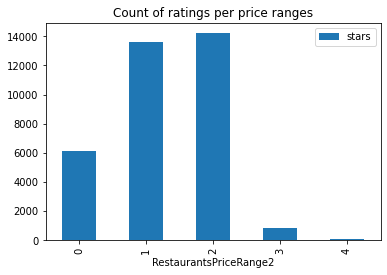

In [ ]:
data_bus[['stars','RestaurantsPriceRange2']].groupby('RestaurantsPriceRange2').count().plot(kind='bar')
plt.title("Count of ratings per price ranges")

## Animated graphic of revisions.
Providing a user code. It will show us the location of the businesses it rates. A summary table of users is built.

In [ ]:
users=pd.read_parquet(r'../data/restaurants/restaurants_reviews.parquet')

In [ ]:
users.columns

Index(['business_id', 'user_id', 'review_stars', 'useful', 'funny', 'cool',
       'text', 'date'],
      dtype='object')

In [ ]:
user_agg=users.groupby('user_id').agg({'business_id':['count'],'date':['min','max'],
                                'useful':['sum'],'funny':['sum'],'cool':['sum'],
                               'review_stars':['mean']})

In [ ]:
user_agg.sort_values([('business_id','count')],ascending=False)

business_id                 date                       \
                             count                  min                  max   
user_id                                                                        
_BcWyKQL16ndpBdggh2kNA        1155  2008-05-29 15:15:17  2021-12-14 21:09:57   
-G7Zkl1wIWBBmD0KRy_sCw        1038  2012-12-25 05:13:30  2022-01-16 23:14:31   
fr1Hz2acAb3OaL3l6DyKNg         871  2014-06-17 23:10:27  2022-01-16 12:14:05   
ET8n-r7glWYqZhuR6GcdNw         765  2008-03-28 19:41:27  2021-04-21 13:55:40   
1HM81n6n4iPIFU5d2Lokhw         748  2011-07-28 15:42:13  2022-01-17 19:34:29   
...                            ...                  ...                  ...   
VysraJqoFguZAOnl8w21JA           1  2019-07-11 18:40:23  2019-07-11 18:40:23   
7raBdFPanSsM1iwgK0OY6A           1  2020-12-30 22:14:50  2020-12-30 22:14:50   
VytIwccpFefLuJO5py7niA           1  2017-12-24 15:16:44  2017-12-24 15:16:44   
VytQyMHd7gbgvN26ShOLdg           1  2020-07-26 16:04:50  2020-07-26 16:04:50   
zzzUFM4HFe0SFG0bPjntQA           1  2019-12-15 15:13:52  2019-12-15 15:13:52   

                       useful  funny   cool review_stars  
                          sum    sum    sum         mean  
user_id                                                   
_BcWyKQL16ndpBdggh2kNA   4842   1489   2897     3.637229  
-G7Zkl1wIWBBmD0KRy_sCw  24703  12781  19229     3.613680  
fr1Hz2acAb3OaL3l6DyKNg  10311   3046   8829     3.971297  
ET8n-r7glWYqZhuR6GcdNw   9851   2765   6361     4.026144  
1HM81n6n4iPIFU5d2Lokhw   3031   1087   1634     3.061497  
...                       ...    ...    ...          ...  
VysraJqoFguZAOnl8w21JA      0      0      0     1.000000  
7raBdFPanSsM1iwgK0OY6A      0      0      0     5.000000  
VytIwccpFefLuJO5py7niA      0      0      0     5.000000  
VytQyMHd7gbgvN26ShOLdg      0      0      0     5.000000  
zzzUFM4HFe0SFG0bPjntQA      0      0      0     5.000000  

[1275365 rows x 7 columns]

In [ ]:
#Stalking the top user:
top_user_reviews=users[users['user_id']=='_BcWyKQL16ndpBdggh2kNA']
# Get locations of the places he/she has reviewed
top_user_locs=pd.merge(top_user_reviews,data_bus,on='business_id')
# UNique list of dates from the user's reviews
date_list=list(top_user_locs['date'].unique())
#rearranging data to suit the format needed for folium
data=[]
for date in date_list:
    subset=top_user_locs[top_user_locs['date']==date]
    df=subset[['latitude','longitude','date']]
    data.append(subset[['latitude','longitude']].values.tolist())

In [ ]:
#initialize at Philadhelpia (the location our top user is from)
lat = 40
lon = -75
zoom_start=9
print("                     Stalking the top User    ")
# basic map
m = folium.Map(location=[lat, lon], tiles="Cartodb Positron", zoom_start=zoom_start)

hm = plugins.HeatMapWithTime(data,max_opacity=0.3,auto_play=True,display_index=True)
hm.add_to(m)
m

                     Stalking the top User    


/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/usr/local/lib/python3.8/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


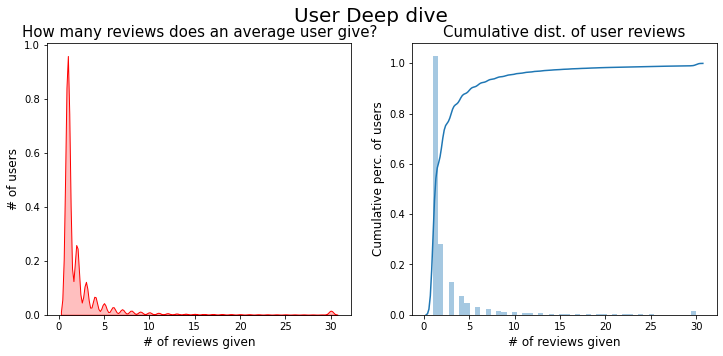

In [ ]:
# Cap max reviews to 30 for better visuals
user_agg[('business_id','count')].loc[user_agg[('business_id','count')]>30] = 30
plt.figure(figsize=(12,5))
plt.suptitle("User Deep dive",fontsize=20)
gridspec.GridSpec(1,2)
plt.subplot2grid((1,2),(0,0))
#Cumulative Distribution
ax=sns.kdeplot(user_agg[('business_id','count')],shade=True,color='r')
plt.title("How many reviews does an average user give?",fontsize=15)
plt.xlabel('# of reviews given', fontsize=12)
plt.ylabel('# of users', fontsize=12)

#Cumulative Distribution
plt.subplot2grid((1,2),(0,1))
sns.distplot(user_agg[('business_id','count')],
             kde_kws=dict(cumulative=True))
plt.title("Cumulative dist. of user reviews",fontsize=15)
plt.ylabel('Cumulative perc. of users', fontsize=12)
plt.xlabel('# of reviews given', fontsize=12)

plt.show()


# Visualisation data model dataset.
We present graphs on the main characteristics created in the previous workbook. They allow us to measure the relationship with the target variable.
Note how with the average sentiment check, the relationship is very clear.

In [ ]:
data_model = pd.read_parquet(r'../data/restaurants/restaurants_data_models.parquet')

In [ ]:
data_model.columns

Index(['metro_area', 'business_id', 'stars', 'name', 'address', 'city',
       'state', 'postal_code', 'latitude', 'longitude', 'Alcohol', 'DriveThru',
       'RestaurantsDelivery', 'RestaurantsPriceRange2', 'rew_count_2016',
       'vander_comp_mean', 'date_min', 'cat_value_mean', 'weekend_hours',
       'lab_day_hours'],
      dtype='object')

Text(0.5, 1.0, 'Distribution of scores by NL analysis averages')

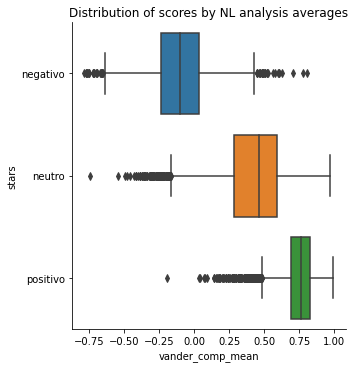

In [ ]:
sns.catplot(y = 'stars', x = 'vander_comp_mean', data = data_model, kind = "box")
plt.title("Distribution of scores by NL analysis averages")

Text(0.5, 1.0, 'Distribution of scores by NL analysis averages')

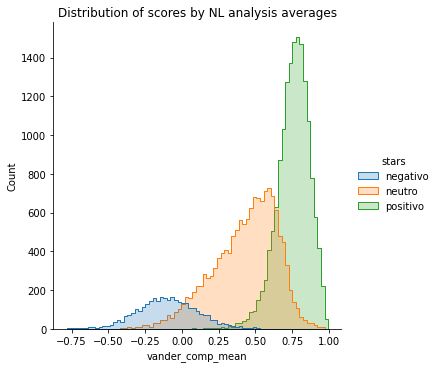

In [ ]:
sns.displot(data_model, x= 'vander_comp_mean', hue="stars", element="step")
plt.title("Distribution of scores by NL analysis averages")

Text(0.5, 1.0, 'Distribution of scores by average of categorical values')

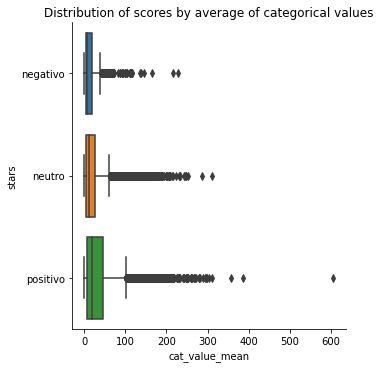

In [ ]:
sns.catplot(y = 'stars', x = 'cat_value_mean', data = data_model, kind = "box")
plt.title("Distribution of scores by average of categorical values")

Text(0.5, 1.0, 'Distribution of scores by average of categorical values')

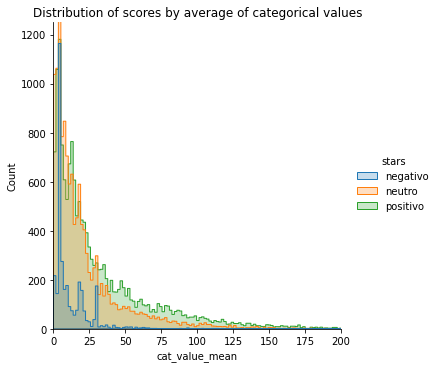

In [ ]:
g = sns.displot(data_model, x= 'cat_value_mean', hue="stars", element="step")
g.set(xlim=(0,200))
g.set(ylim=(0,1250))
plt.title("Distribution of scores by average of categorical values")

Text(0.5, 1.0, 'Distribution of ratings by review count')

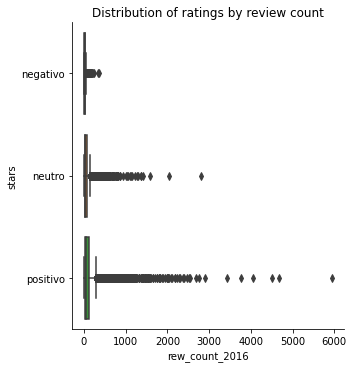

In [ ]:
sns.catplot(y = 'stars', x = 'rew_count_2016', data = data_model, kind = "box")
plt.title("Distribution of ratings by review count")

Text(0.5, 1.0, 'Distribution of ratings by review count')

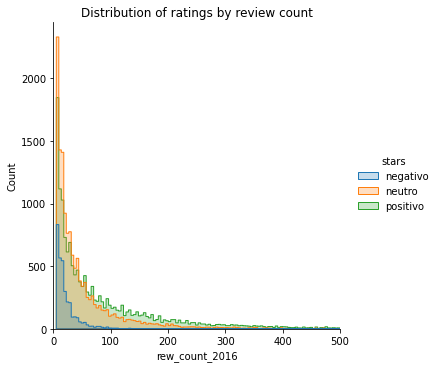

In [ ]:
g=sns.displot(data_model, x= 'rew_count_2016', hue="stars", element="step")
g.set(xlim=(0,500))
plt.title("Distribution of ratings by review count")